# UNET Attention gates test

## Custom Parameters
Here you can change some of the main parameters of the model

In [1]:
width = 256
height = 256
epochs = 50

batch_size = 8
learning_rate = 0.001
dropout_rate = 0.5
num_workers = 4
max_images = 2048

use_attention = True
attention_model = "Attention_Gate" # For saving training name
use_att4 = "None"
use_att3 = "None"
use_att2 = "None"
use_att1 = "Attention_Gate"

new_aug_epoch_distance = 5 #how many epochs between new augmentations
number_of_augmentations = 1

show_images = True

In [2]:
OPENSLIDE_PATH = r'D:\Estudos\IC\Libraries\openslide-bin-4.0.0.3-windows-x64\openslide-bin-4.0.0.3-windows-x64\bin'

import os
if hasattr(os, 'add_dll_directory'):
    with os.add_dll_directory(OPENSLIDE_PATH):
        import openslide
else:
    import openslide

### Imports

In [3]:
import sys
import os
import re
import random
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.nn.functional import softmax
import torch.cuda.amp as amp
from torch.utils.data import DataLoader, random_split
from tqdm import tqdm
import numpy as np
import cv2
from scipy.io import loadmat
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from PIL import Image
from torchvision import ops
from torchvision.transforms import ToTensor, ToPILImage
from torchvision.utils import save_image
import torchvision.transforms.functional as TF
from albumentations.pytorch import ToTensorV2
import albumentations as A
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
from torchvision.models import resnet50, ResNet50_Weights
import imageio
from IPython import display
from pytorch_grad_cam import GradCAM, HiResCAM, GradCAMElementWise, GradCAMPlusPlus, XGradCAM, AblationCAM, ScoreCAM
from pytorch_grad_cam import EigenCAM, EigenGradCAM, LayerCAM, FullGrad
from pytorch_grad_cam.utils.image import show_cam_on_image

sys.path.append(r'D:\Estudos\IC\CNN\CNN\Model')
from TrainingDataArrangement import arrange_data
import CustomDataset
from UNetModel import UNet
from DaliDataAug import load_pil_image, data_augmentation


#defining device
device = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)
print(f"Using {device} device")

INFO:albumentations.check_version:A new version of Albumentations is available: 2.0.6 (you have 1.4.8). Upgrade using: pip install --upgrade albumentations


Using cuda device


### Setting the seed

In [4]:
def set_seed(seed):  
    random.seed(seed) #setting for albumentations
    np.random.seed(seed)
    
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(727)

### Getting the dataset

C:\Users\Gabriel\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pydantic\main.py:347: UserWarning: Pydantic serializer warnings:
  Expected `Union[float, tuple[float, float]]` but got `list` - serialized value may not be as expected
  Expected `Union[float, tuple[float, float]]` but got `list` - serialized value may not be as expected
  Expected `Union[float, tuple[float, float]]` but got `list` - serialized value may not be as expected
  Expected `Union[float, tuple[float, float]]` but got `list` - serialized value may not be as expected
  return self.__pydantic_serializer__.to_python(


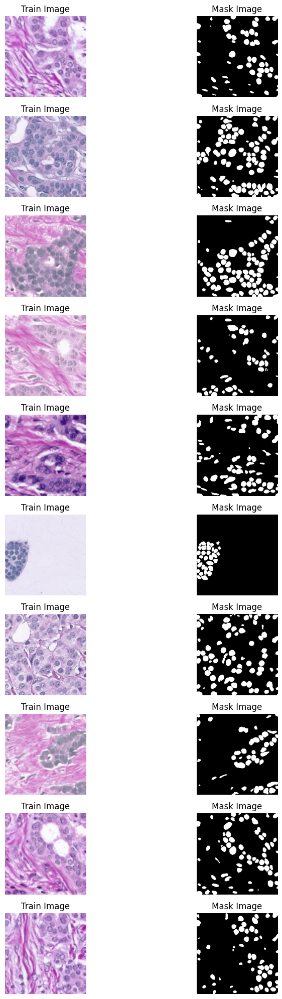

In [5]:

training_path = r"D:\Estudos\IC\DataSets\Snow\SNOW_Image\Images"
mask_path = r"D:\Estudos\IC\DataSets\Snow\SNOW_Image\Masks"

#data augmentation
augmentation_transform = A.Compose([
    #A.ToPIL(),
    A.Resize(width = width, height = height, p=1.0),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.25),
    A.RandomRotate90(p=0.5),
    A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),
    A.Transpose(p=0.25),
    #A.RandomResizedCrop(224, 224, scale=(0.8, 1.0)),
    # A.GridDistortion(num_steps=5, distort_limit=(-0.3, 0.3), interpolation=1, border_mode=4, p=0.3),
    # A.ElasticTransform(alpha=1, sigma=50, alpha_affine=50, interpolation=1, border_mode=4, p=0.3),
    # A.OpticalDistortion(distort_limit=(-0.05, 0.05), shift_limit=(-0.05, 0.05), interpolation=1, border_mode=4, p=0.3),
    # A.Perspective(scale=(0.05, 0.1), keep_size=True, pad_mode=0, pad_val=0, mask_pad_val=0, fit_output=False, interpolation=1, p=0.3),
    # A.PiecewiseAffine (scale=(0.03, 0.05), nb_rows=4, nb_cols=4, interpolation=1, mask_interpolation=0, cval=0, cval_mask=0, mode='constant', absolute_scale=False, keypoints_threshold=0.01, p=0.1),
    # A.ShiftScaleRotate (shift_limit=(-0.0625, 0.0625), scale_limit=(-0.1, 0.1), rotate_limit=(-45, 45), interpolation=1, border_mode=4, value=0, mask_value=0, rotate_method='largest_box', p=0.15),
    ToTensorV2()  # loading image to tensor and normalization
])
test_transform = A.Compose([
    #A.ToPIL(),
    A.Resize(width = width, height = height, p=1.0),
    #A.HorizontalFlip(p=0.5),
    #A.VerticalFlip(p=0.25),
    #A.RandomRotate90(p=0.5),
    #A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),
    #A.Transpose(p=0.5),
    #A.RandomResizedCrop(224, 224, scale=(0.8, 1.0)),
    ToTensorV2()  # loading image to tensor and normalization
])

dataset = CustomDataset.CustomImageDataset(training_path, mask_path, transform=test_transform)

# Making it only an certain ammount of images
limited_dataset = torch.utils.data.Subset(dataset, indices=range(min(len(dataset), max_images)))


train_size = int(0.7 * len(limited_dataset ))
test_size = len(limited_dataset ) - train_size
train_dataset, test_dataset = random_split(limited_dataset , [train_size, test_size])
# 70/30 for training and validation
new_train_size = int(0.7 * train_size)
validation_size = train_size - new_train_size
temp_train_dataset, validation_dataset = random_split(train_dataset, [new_train_size, validation_size])
test_dataset.dataset.transform = test_transform
training_dataset = temp_train_dataset
train_dataloader = DataLoader(training_dataset, batch_size=batch_size, shuffle=True)
test_dataloader = DataLoader(test_dataset , batch_size=batch_size, shuffle=False)
validation_dataloader = DataLoader(validation_dataset, batch_size = batch_size, shuffle=True)
if show_images:
    num_images_to_display = 10
    fig, axs = plt.subplots(num_images_to_display, 2, figsize=(10, 20))
    for i in range(num_images_to_display):
        train_image, mask_image, _ = train_dataset[i]
        train_image = train_image.permute(1, 2, 0).numpy()

        axs[i, 0].imshow(train_image)
        axs[i, 0].set_title('Train Image')
        axs[i, 0].axis('off')

        mask_image = mask_image.squeeze(0).numpy()
        axs[i, 1].imshow(mask_image, cmap='gray')
        axs[i, 1].set_title('Mask Image')
        axs[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

### Dir Checker

In [6]:

def dir_checker_and_restarter(images_dir):
    os.makedirs(images_dir, exist_ok=True)
    for filename in os.listdir(images_dir): #deleting all previous images files
        file_path = os.path.join(images_dir, filename)
        try:
            if os.path.isfile(file_path):
                os.remove(file_path)
        except Exception as e:
            print(f"Failed to delete {file_path}. Reason: {e}")
def center_crop_image(image, width, height):
    original_width, original_height = image.size

    left = (original_width - width) / 2
    top = (original_height - height) / 2
    right = left + width
    bottom = top + height

    return image.crop((left, top, right, bottom))

def save_image(image, path):
    image.save(path)

def recreate_data_loader(number_of_augmentations = 5):
    input_dir_train = r"D:\Estudos\IC\DataSets\Snow\SNOW_Image"
    output_dir_train = r"D:\Estudos\IC\DataSets\Snow\UnetTraining\Transformed"

    main_dirs = [output_dir_train]

    for dir in main_dirs:
        if not os.path.exists(dir):
            os.makedirs(dir + "\Images")
            os.makedirs(dir + "\Masks")
        else:
            dir_checker_and_restarter(dir)

    augmentation = ["horizontal_flip", "vertical_flip", "rotation", "transpose"]

    img_input_size = (width, height)
    img_output_size = (width, height)

    dirs = [input_dir_train]
    for i in range(number_of_augmentations):
        for dir in dirs:
            img_path_appended = os.path.join(dir, "Images")
            mask_path_appended = os.path.join(dir, "Masks")

            image_files = [f for f in os.listdir(img_path_appended) if f.endswith(('.jpg', '.png', '.jpeg', 'tif'))]
            mask_files = [f for f in os.listdir(mask_path_appended) if f.endswith(('.jpg', '.png', '.jpeg', 'tif', '.mat'))]

            for img_name, mask_name in zip(image_files, mask_files):
                img_path = os.path.join(img_path_appended, img_name)
                mask_path = os.path.join(mask_path_appended, mask_name)

                input_image = load_pil_image(img_path, False)
                mat_data = loadmat(mask_path)
                mask = mat_data.get('inst_map')
                if mask_image.dtype != np.uint8:
                    mask = (mask * 255).astype(np.uint8)
                mask_pil = Image.fromarray(mask)

                cropped_input_image = center_crop_image(input_image, width, height)
                cropped_mask = center_crop_image(mask_pil, width, height)

                target_image = None
                GAN_model = None

                augmented_img, augmented_mask, used_augmentations = data_augmentation(cropped_input_image, target_image, cropped_mask, img_input_size, img_output_size, augmentation, GAN_model)

                    
                output_img_path = os.path.join(output_dir_train, f"Images\\aug{i}_{img_name}")
                base_mask_name = os.path.splitext(mask_name)[0]
                output_mask_path = os.path.join(output_dir_train, f"Masks\\aug{i}_{base_mask_name}.png")

                save_image(TF.to_pil_image(augmented_img), output_img_path)
                save_image(TF.to_pil_image(augmented_mask), output_mask_path)
    print(f"Finished loading {number_of_augmentations} new augmentations in the whole dataset")
                

    # 70/30 split
    training_dataset = CustomDataset.CustomImageDataset(output_dir_train + "\\Images", output_dir_train + "\\Masks", transform=test_transform)
    train_size = int(0.7 * len(training_dataset))
    test_size = len(training_dataset) - train_size
    train_dataset, test_dataset = random_split(training_dataset, [train_size, test_size])

    # 70/30 for training and validation
    new_train_size = int(0.7 * train_size)
    validation_size = train_size - new_train_size
    temp_train_dataset, validation_dataset = random_split(train_dataset, [new_train_size, validation_size])

    test_dataset.dataset.transform = test_transform
    training_dataset = temp_train_dataset

    train_dataloader = DataLoader(training_dataset, batch_size=batch_size, shuffle=True)
    test_dataloader = DataLoader(test_dataset , batch_size=batch_size, shuffle=False)
    validation_dataloader = DataLoader(validation_dataset, batch_size = batch_size, shuffle=True)


    return train_dataloader, test_dataloader, validation_dataloader
#train_dataloader, test_dataloader, validation_dataloader = recreate_data_loader(number_of_augmentations)
    

### Setting GradCAM

In [7]:
gradcam_width = width
gradcam_height = height

def save_and_display_gradcam(img_path, heatmap, alpha=0.6):
    img = cv2.imread(img_path)
    img = cv2.resize(img, (gradcam_width, gradcam_height))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    mask_path = img_path.replace(r"\testing\images", r"\testing\masks")
    mask = cv2.imread(mask_path)
    mask = cv2.resize(mask, (gradcam_width, gradcam_height))

    superimposed_img = cv2.addWeighted(heatmap, alpha, img, 1 - alpha, 0)

    plt.figure(figsize=(10, 10))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
    plt.title('GradCAM')
    plt.axis('off')
    plt.tight_layout()

    plt.subplot(1, 2, 2)
    plt.imshow(img)
    plt.imshow(mask, alpha=0.5)
    plt.title("Original Mask With Image")
    plt.axis('off')
    plt.show()

def make_gradcam_heatmap(img_tensor, model, target_layer):
    model.eval()
    
    features = None
    gradients = None
    
    def forward_hook(module, input, output):
        nonlocal features
        features = output
    
    def backward_hook(module, grad_in, grad_out):
        nonlocal gradients
        gradients = grad_out[0]
    
    handle_forward = target_layer.register_forward_hook(forward_hook)
    handle_backward = target_layer.register_full_backward_hook(backward_hook)
    
    with amp.autocast():
        preds = model(img_tensor)
        pred_class = preds.argmax(dim=1)
    
    model.zero_grad()
    class_score = preds[:, pred_class].squeeze().sum()
    class_score.backward(retain_graph=True)
    
    handle_forward.remove()
    handle_backward.remove()
    
    pooled_gradients = torch.mean(gradients, dim=[0, 2, 3])
    for i in range(features.shape[1]):
        features[:, i, :, :] *= pooled_gradients[i]
    
    heatmap = features.mean(dim=1).squeeze()
    heatmap = np.maximum(heatmap.detach().cpu().numpy(), 0)
    epsilon = 1e-8
    heatmap_max = np.max(heatmap)
    heatmap = heatmap / (heatmap_max + epsilon)
    
    del features, gradients
    torch.cuda.empty_cache()
    
    return heatmap

def make_prediction_and_visualize(image_paths):
    for img_path in image_paths:
        img = cv2.imread(img_path)
        img = cv2.resize(img, (gradcam_width, gradcam_height))
        img_tensor = torch.tensor(img / 255.0).permute(2, 0, 1).unsqueeze(0).float()

        target_layer = model.upconv2

        heatmap = make_gradcam_heatmap(img_tensor.to(device), model, target_layer)

        save_and_display_gradcam(img_path, heatmap)

def generate_heatmap(img_path): 
    img = cv2.imread(img_path)
    img = cv2.resize(img, (gradcam_width, gradcam_height))
    img_tensor = torch.tensor(img / 255.0).permute(2, 0, 1).unsqueeze(0).float()
    target_layer = model.upconv2
    return make_gradcam_heatmap(img_tensor.to(device), model, target_layer)

def generate_heatmap_with_tensor(img): 
    target_layer = model.upconv2
    return make_gradcam_heatmap(img.unsqueeze(0), model, target_layer)





# image_paths = [
#     r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\appended_folder\testing\images\1009009_r27c5.png",
#     r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\appended_folder\testing\images\1009009_r27c10.png",
#     r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\appended_folder\testing\images\1009009_r28c12.png",
#     r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\appended_folder\testing\images\1009009_r31c0.png",
#     r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\appended_folder\testing\images\1009009_r31c1.png",
#     r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\appended_folder\testing\images\1009009_r35c4.png",
#     r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\appended_folder\testing\images\1009009_r35c8.png",
#     r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\appended_folder\testing\images\1009009_r35c10.png",
# ]

# make_prediction_and_visualize(image_paths)




### Setting ResNet

In [8]:
def generate_ResNet_CAM(model, image, index, cam_layer, cam_type = "gradcam", target_label = 0):
    target_layers = cam_layer
    
    input_tensor = image

    targets = [ClassifierOutputTarget(target_label)]

    def denormalize(image):
        mean = torch.tensor([0.485, 0.456, 0.406]).to(device).view(3, 1, 1)
        std = torch.tensor([0.229, 0.224, 0.225]).to(device).view(3, 1, 1)

        image = image * std + mean
        return image

    def to_numpy_uint8(image):
        image = image.detach().cpu().numpy()
        image = np.transpose(image, (1, 2, 0))
        image = np.clip(image, 0, 1)
        image = (image * 255).astype(np.uint8)
        return image

    image_to_show = denormalize(image[index])
    image_to_show = to_numpy_uint8(image_to_show)
    image_to_show = image_to_show / 255

    match cam_type.lower():
            case "gradcam":
                with GradCAM(model=model, target_layers=target_layers) as cam:
                    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
            case "hirescam":
                with HiResCAM(model=model, target_layers=target_layers) as cam:
                    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
            case "gradcamelementwise":
                with GradCAMElementWise(model=model, target_layers=target_layers) as cam:
                    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
            case "gradcam++":
                with GradCAMPlusPlus(model=model, target_layers=target_layers) as cam:
                    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
            case "xgradcam":
                with XGradCAM(model=model, target_layers=target_layers) as cam:
                    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
            case "ablationcam":
                with AblationCAM(model=model, target_layers=target_layers) as cam:
                    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
            case "scorecam":
                with ScoreCAM(model=model, target_layers=target_layers) as cam:
                    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
            case "eigencam":
                with EigenCAM(model=model, target_layers=target_layers) as cam:
                    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
            case "eigengradcam":
                with EigenGradCAM(model=model, target_layers=target_layers) as cam:
                    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
            case "layercam":
                with LayerCAM(model=model, target_layers=target_layers) as cam:
                    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
            case _:
                raise ValueError(f"CAM type '{cam_type}' invalid")
    
    grayscale_cam = grayscale_cam[0, :]
    return show_cam_on_image(image_to_show, grayscale_cam, use_rgb=True)

In [9]:
model_path = os.path.join("..", "..", "resnet50_trained.pth")
metrics_path = os.path.join("..", "..", "resnet50_metrics.pth")

model_resnet = resnet50(pretrained=True)
model_resnet.fc = nn.Linear(model_resnet.fc.in_features, 3)
model_resnet = model_resnet.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model_resnet.parameters(), lr=1e-4)

if os.path.exists(model_path) and os.path.exists(metrics_path):
    print("Loading pre-trained model and metrics...")
    model_resnet.load_state_dict(torch.load(model_path, map_location=device))
    metrics = torch.load(metrics_path)
    train_losses = metrics['train_losses']
    train_accuracies = metrics['train_accuracies']
    training_required = False
else:
    print("No pre-trained model found. Training from scratch...")
    training_required = True
    train_losses = []
    train_accuracies = []

resnet_epochs = 5

if training_required:
    for epoch in range(resnet_epochs):
        model_resnet.train()
        running_loss = 0.0
        correct_predictions = 0
        total_predictions = 0

        for images, masks, filenames in tqdm(train_dataloader, desc=f'Epoch {epoch + 1}/{resnet_epochs}', leave=False):
            images, masks = images.to(device), masks.to(device)

            labels = []
            for filename in filenames:
                if re.search(r".png", filename):
                    labels.append(0)
                elif re.search(r".mat", filename):
                    labels.append(1)
            labels = torch.tensor(labels, dtype=torch.long, device=device)

            optimizer.zero_grad()

            outputs = model_resnet(images)

            loss = criterion(outputs, labels)

            loss.backward()
            optimizer.step()

            running_loss += loss.item() * images.size(0)
            preds = torch.argmax(outputs, dim=1)
            correct_predictions += (preds == labels).sum().item()
            total_predictions += labels.size(0)

        epoch_loss = running_loss / len(train_dataloader.dataset)
        epoch_accuracy = correct_predictions / total_predictions

        train_losses.append(epoch_loss)
        train_accuracies.append(epoch_accuracy)

        print(f'Epoch {epoch + 1}/{resnet_epochs} - Loss: {epoch_loss:.4f} - Accuracy: {epoch_accuracy:.4f}')

    print("Saving trained model and metrics...")
    torch.save(model_resnet.state_dict(), model_path)
    torch.save({'train_losses': train_losses, 'train_accuracies': train_accuracies}, metrics_path)

C:\Users\Gabriel\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\Gabriel\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading pre-trained model and metrics...


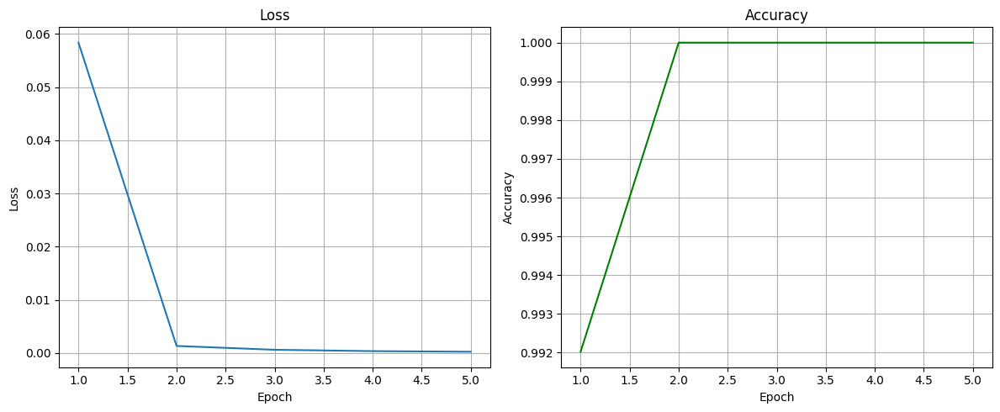

  0%|          | 0/54 [00:00<?, ?it/s]


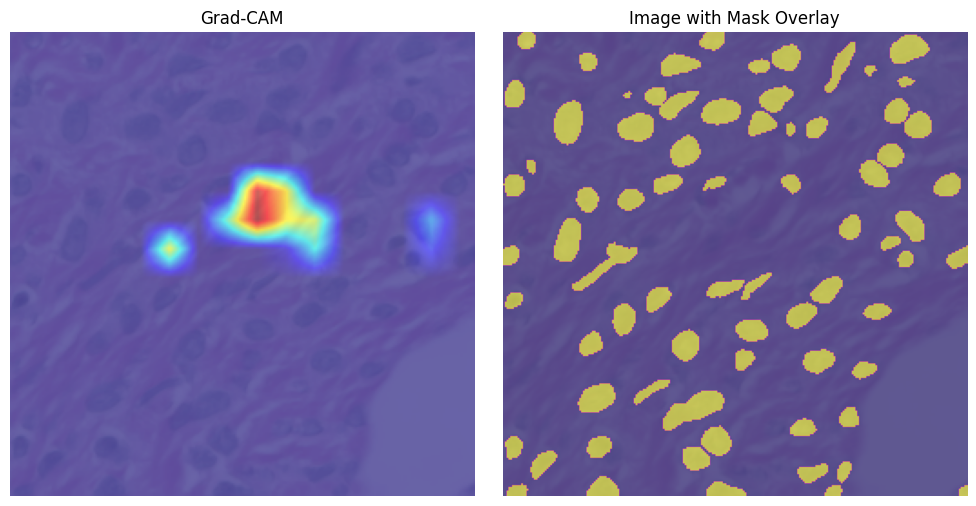

In [10]:
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(range(1, resnet_epochs + 1), train_losses, label='Training Loss')
plt.title('Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(range(1, resnet_epochs + 1), train_accuracies, color='green', label='Training Accuracy')
plt.title('Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.grid(True)

plt.tight_layout()
plt.show()


image = []
mask = []

model_resnet.eval()
with torch.no_grad():
    for images, masks, filenames in tqdm(validation_dataloader):
        images, masks = images.to(device), masks.to(device)
        if torch.any(masks > 0):
            test_image_resnet = images[0].detach()
            image = test_image_resnet
            mask = masks[0].detach()
            break

first_image_batch = test_image_resnet.unsqueeze(0)
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
cam_image = generate_ResNet_CAM(model_resnet, first_image_batch, 0, [model_resnet.layer3[-1]], "xgradcam", 1)
plt.imshow(cam_image)
plt.axis('off')
plt.title('Grad-CAM')

plt.subplot(1, 2, 2)
def denormalize(image):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    image = image.cpu().numpy().transpose((1, 2, 0))
    image = std * image + mean
    image = np.clip(image, 0, 1)
    return image

image_to_show = denormalize(image)
plt.imshow(image_to_show)
plt.imshow(mask.cpu().numpy()[0], alpha=0.5, cmap='plasma')
plt.axis('off')
plt.title('Image with Mask Overlay')

plt.tight_layout()
plt.show()

### Training

In [11]:
channels = 3
classes = 1
model = UNet(channels, classes, use_attention=use_attention, att_1 = use_att1, att_2 = use_att2, att_3 = use_att3, att_4= use_att4, dropout_rate = dropout_rate)
input_data = torch.randn(1, channels, width, height)
output = model(input_data)
criterion = nn.BCEWithLogitsLoss(reduction="mean")
optimizer = optim.Adam(model.parameters(), lr=learning_rate)
model.to(device)

num_epochs = epochs

training_accuracies = []
training_losses = []
val_losses = []
val_accuracies = []
# Loading and saving
checkpoint_path = "model_checkpoint" + attention_model + ".pth"
if os.path.exists(checkpoint_path):
    checkpoint = torch.load(checkpoint_path)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    start_epoch = checkpoint['epoch'] + 1
    training_accuracies = checkpoint['training_accuracies']
    training_losses = checkpoint['training_losses']
    val_losses = checkpoint['val_losses']
    val_accuracies = checkpoint['val_accuracies']
    print(f"Checkpoint loaded. Resuming training from epoch {start_epoch}.")
else:
    start_epoch = 0
    print("No checkpoint found. Starting training from scratch.")

def save_checkpoint(epoch, model, optimizer, training_accuracies, training_losses, val_losses, val_accuracies):
    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'training_accuracies': training_accuracies,
        'training_losses': training_losses,
        'val_losses': val_losses,
        'val_accuracies': val_accuracies
    }
    torch.save(checkpoint, checkpoint_path)
    print(f"Checkpoint saved at epoch {epoch + 1}.")


images_dir = "epoch_images" + attention_model
os.makedirs(images_dir, exist_ok=True)
for images, masks , filenames in test_dataloader:
    images, masks = images.to(device), masks.to(device)
    if torch.any(masks > 0):
        first_image_in_dataset = images[0].detach()
        first_mask_in_dataset = masks[0].detach()
        break
first_image_batch = first_image_in_dataset.unsqueeze(0)

for epoch in range(start_epoch, num_epochs):
    model.train()
    running_loss = 0.0
    correct_predictions = 0
    total_samples = 0
    

    for images, masks, filenames in tqdm(train_dataloader, desc=f'Epoch {epoch + 1}/{num_epochs}', leave=False):
        images, masks = images.to(device), masks.to(device)

        optimizer.zero_grad()
        outputs = model(images)

        loss = F.binary_cross_entropy(outputs, masks)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        running_loss += loss.item()

        #thresholding the prediction values
        _, predicted = torch.max(outputs, 1)
        binary_predictions = (outputs > 0.5).float()
        
        #calculating the correct pixels
        correct_predictions += (binary_predictions == masks).sum().item()

        total_samples += masks.numel()
    
    epoch_loss = running_loss / len(train_dataloader)
    epoch_accuracy = correct_predictions / total_samples

    training_accuracies.append(epoch_accuracy)
    training_losses.append(epoch_loss)

    print(f"Epoch {epoch + 1} Loss: {epoch_loss:.4f}, Accuracy: {epoch_accuracy * 100:.2f}%")

    #validation
    val_loss = 0.0
    val_correct_predictions = 0
    val_total_samples = 0   
    with torch.no_grad():
        for val_images, val_masks, filenames in tqdm(validation_dataloader, desc='Validation', leave=False):
            val_images, val_masks = val_images.to(device), val_masks.to(device)
            val_outputs = model(val_images)

            val_loss += F.binary_cross_entropy(val_outputs, val_masks).item()

            val_binary_predictions = (val_outputs > 0.5).float()

            val_correct_predictions += (val_binary_predictions == val_masks).sum().item()

            val_total_samples += val_masks.numel()

    val_epoch_loss = val_loss / len(validation_dataloader)
    val_epoch_accuracy = val_correct_predictions / val_total_samples

    val_losses.append(val_epoch_loss)
    val_accuracies.append(val_epoch_accuracy)

    print(f"Validation Loss: {val_epoch_loss:.4f}, Validation Accuracy: {val_epoch_accuracy * 100:.2f}%\n")
    print("============================================")
            

    if(show_images):
        heatmap = generate_heatmap_with_tensor(first_image_in_dataset.to(device).half())#making heatmap only of the first image of the batch
        resnet_img = generate_ResNet_CAM(model_resnet, first_image_batch, 0, [model_resnet.layer3[-1]], "xgradcam", 1)
        with torch.no_grad():
            outputs = model(first_image_batch)
            probs = outputs
            images_np = first_image_in_dataset.cpu().numpy().transpose((1, 2, 0))
            masks_np = first_mask_in_dataset.cpu().numpy().transpose((1, 2, 0))
            probs_np = probs.cpu().numpy()
            threshold = 0.5
            preds_np = (probs_np > threshold).astype(np.uint8)
            preds_np_squeezed = np.squeeze(preds_np, axis=1) 
            plt.figure(figsize=(16, 8))
            plt.subplot(1, 4, 1)
            plt.imshow(images_np)
            plt.imshow(masks_np, alpha=0.5, cmap='plasma')
            plt.title("Original Image with Ground Truth Mask")
            plt.axis('off')
            plt.subplot(1, 4, 2)
            plt.imshow(images_np)
            plt.imshow(preds_np_squeezed[0], alpha=0.5, cmap='plasma')
            plt.title("Predicted Mask" + f" ({val_epoch_accuracy * 100:.2f}%)" + f"Epoch {epoch + 1}")
            plt.axis('off')
                    
            #gradcam heatmap
            img = first_image_in_dataset.cpu().detach().permute(1, 2, 0).numpy()
            img = (img - img.min()) / (img.max() - img.min()) #normalizing
            img = np.uint8(255 * img)

            heatmap = np.uint8(255 * heatmap)
            heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
            heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

            superimposed_img = cv2.addWeighted(heatmap, 0.6, img, 1 - 0.6, 0)

            plt.subplot(1, 4, 3)
            plt.imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
            plt.title('GradCAM with Overlay')
            plt.axis('off')

            plt.subplot(1, 4, 4)
            plt.imshow(resnet_img)
            plt.title('GradCAM ResNet')
            plt.axis('off')

            #saving the figs for the gif
            plt.savefig(os.path.join(images_dir, f'epoch_{epoch + 1}.png'))
            if epoch % 5 == 0: 
                #plt.show()
                pass
            plt.close()
    if (epoch % new_aug_epoch_distance == 0 and epoch != 0) or epoch == num_epochs - 1: #dynamic data loader changing to improve loss
        #train_dataloader, test_dataloader, validation_dataloader = recreate_data_loader(number_of_augmentations)
        save_checkpoint(epoch, model, optimizer, training_accuracies, training_losses, val_losses, val_accuracies)
        print("Saved Checkpoint")

No checkpoint found. Starting training from scratch.


Epoch 1 Loss: 0.2555, Accuracy: 92.83%


Validation Loss: 0.1611, Validation Accuracy: 94.50%



Epoch 2 Loss: 0.1402, Accuracy: 94.70%


Validation Loss: 0.1253, Validation Accuracy: 94.97%



Epoch 3 Loss: 0.1079, Accuracy: 95.69%


Validation Loss: 0.0916, Validation Accuracy: 96.28%



Epoch 4 Loss: 0.0859, Accuracy: 96.49%


Validation Loss: 0.0849, Validation Accuracy: 96.49%



Epoch 5 Loss: 0.0760, Accuracy: 96.86%


Validation Loss: 0.0717, Validation Accuracy: 97.04%



Epoch 6 Loss: 0.0692, Accuracy: 97.12%


Validation Loss: 0.0705, Validation Accuracy: 97.09%

Checkpoint saved at epoch 6.
Saved Checkpoint


Epoch 7 Loss: 0.0691, Accuracy: 97.10%


Validation Loss: 0.0642, Validation Accuracy: 97.29%



Epoch 8 Loss: 0.0660, Accuracy: 97.24%


Validation Loss: 0.0687, Validation Accuracy: 97.16%



Epoch 9 Loss: 0.0613, Accuracy: 97.43%


Validation Loss: 0.0615, Validation Accuracy: 97.39%



Epoch 10 Loss: 0.0583, Accuracy: 97.54%


Validation Loss: 0.0580, Validation Accuracy: 97.55%



Epoch 11 Loss: 0.0561, Accuracy: 97.64%


Validation Loss: 0.0584, Validation Accuracy: 97.51%

Checkpoint saved at epoch 11.
Saved Checkpoint


Epoch 12 Loss: 0.0545, Accuracy: 97.70%


Validation Loss: 0.0591, Validation Accuracy: 97.50%



Epoch 13 Loss: 0.0534, Accuracy: 97.75%


Validation Loss: 0.0534, Validation Accuracy: 97.74%



Epoch 14 Loss: 0.0524, Accuracy: 97.78%


Validation Loss: 0.0523, Validation Accuracy: 97.78%



Epoch 15 Loss: 0.0509, Accuracy: 97.85%


Validation Loss: 0.0537, Validation Accuracy: 97.73%



Epoch 16 Loss: 0.0501, Accuracy: 97.88%


Validation Loss: 0.0515, Validation Accuracy: 97.82%

Checkpoint saved at epoch 16.
Saved Checkpoint


Epoch 17 Loss: 0.0509, Accuracy: 97.84%


Validation Loss: 0.0530, Validation Accuracy: 97.76%



Epoch 18 Loss: 0.0483, Accuracy: 97.96%


Validation Loss: 0.0496, Validation Accuracy: 97.89%



Epoch 19 Loss: 0.0475, Accuracy: 97.99%


Validation Loss: 0.0496, Validation Accuracy: 97.89%



Epoch 20 Loss: 0.0473, Accuracy: 97.99%


Validation Loss: 0.0496, Validation Accuracy: 97.91%



Epoch 21 Loss: 0.0457, Accuracy: 98.06%


Validation Loss: 0.0481, Validation Accuracy: 97.96%

Checkpoint saved at epoch 21.
Saved Checkpoint


Epoch 22 Loss: 0.0462, Accuracy: 98.04%


Validation Loss: 0.0476, Validation Accuracy: 97.99%



Epoch 23 Loss: 0.0445, Accuracy: 98.12%


Validation Loss: 0.0485, Validation Accuracy: 97.93%



Epoch 24 Loss: 0.0446, Accuracy: 98.11%


Validation Loss: 0.0483, Validation Accuracy: 97.95%



Epoch 25 Loss: 0.0436, Accuracy: 98.15%


Validation Loss: 0.0464, Validation Accuracy: 98.04%



Epoch 26 Loss: 0.0433, Accuracy: 98.17%


Validation Loss: 0.0489, Validation Accuracy: 97.93%

Checkpoint saved at epoch 26.
Saved Checkpoint


Epoch 27 Loss: 0.0431, Accuracy: 98.17%


Validation Loss: 0.0469, Validation Accuracy: 98.02%



Epoch 28 Loss: 0.0423, Accuracy: 98.20%


Validation Loss: 0.0475, Validation Accuracy: 97.99%



Epoch 29 Loss: 0.0419, Accuracy: 98.21%


Validation Loss: 0.0464, Validation Accuracy: 98.06%



Epoch 30 Loss: 0.0406, Accuracy: 98.27%


Validation Loss: 0.0453, Validation Accuracy: 98.07%



Epoch 31 Loss: 0.0416, Accuracy: 98.22%


Validation Loss: 0.0452, Validation Accuracy: 98.09%

Checkpoint saved at epoch 31.
Saved Checkpoint


Epoch 32 Loss: 0.0401, Accuracy: 98.29%


Validation Loss: 0.0455, Validation Accuracy: 98.06%



Epoch 33 Loss: 0.0401, Accuracy: 98.28%


Validation Loss: 0.0449, Validation Accuracy: 98.09%



Epoch 34 Loss: 0.0401, Accuracy: 98.29%


Validation Loss: 0.0482, Validation Accuracy: 97.99%



Epoch 35 Loss: 0.0395, Accuracy: 98.32%


Validation Loss: 0.0451, Validation Accuracy: 98.09%



Epoch 36 Loss: 0.0388, Accuracy: 98.34%


Validation Loss: 0.0445, Validation Accuracy: 98.11%

Checkpoint saved at epoch 36.
Saved Checkpoint


Epoch 37 Loss: 0.0382, Accuracy: 98.36%


Validation Loss: 0.0479, Validation Accuracy: 97.97%



Epoch 38 Loss: 0.0385, Accuracy: 98.35%


Validation Loss: 0.0444, Validation Accuracy: 98.14%



Epoch 39 Loss: 0.0381, Accuracy: 98.37%


Validation Loss: 0.0439, Validation Accuracy: 98.15%



Epoch 40 Loss: 0.0373, Accuracy: 98.42%


Validation Loss: 0.0461, Validation Accuracy: 98.09%



Epoch 41 Loss: 0.0375, Accuracy: 98.40%


Validation Loss: 0.0450, Validation Accuracy: 98.10%

Checkpoint saved at epoch 41.
Saved Checkpoint


Epoch 42 Loss: 0.0370, Accuracy: 98.42%


Validation Loss: 0.0443, Validation Accuracy: 98.12%



Epoch 43 Loss: 0.0371, Accuracy: 98.41%


Validation Loss: 0.0438, Validation Accuracy: 98.15%



Epoch 44 Loss: 0.0362, Accuracy: 98.45%


Validation Loss: 0.0440, Validation Accuracy: 98.16%



Epoch 45 Loss: 0.0355, Accuracy: 98.48%


Validation Loss: 0.0433, Validation Accuracy: 98.18%



Epoch 46 Loss: 0.0358, Accuracy: 98.47%


Validation Loss: 0.0448, Validation Accuracy: 98.13%

Checkpoint saved at epoch 46.
Saved Checkpoint


Epoch 47 Loss: 0.0367, Accuracy: 98.44%


Validation Loss: 0.0429, Validation Accuracy: 98.19%



Epoch 48 Loss: 0.0354, Accuracy: 98.49%


Validation Loss: 0.0497, Validation Accuracy: 97.92%



Epoch 49 Loss: 0.0351, Accuracy: 98.50%


Validation Loss: 0.0442, Validation Accuracy: 98.15%



Epoch 50 Loss: 0.0344, Accuracy: 98.53%


Validation Loss: 0.0433, Validation Accuracy: 98.18%

Checkpoint saved at epoch 50.
Saved Checkpoint


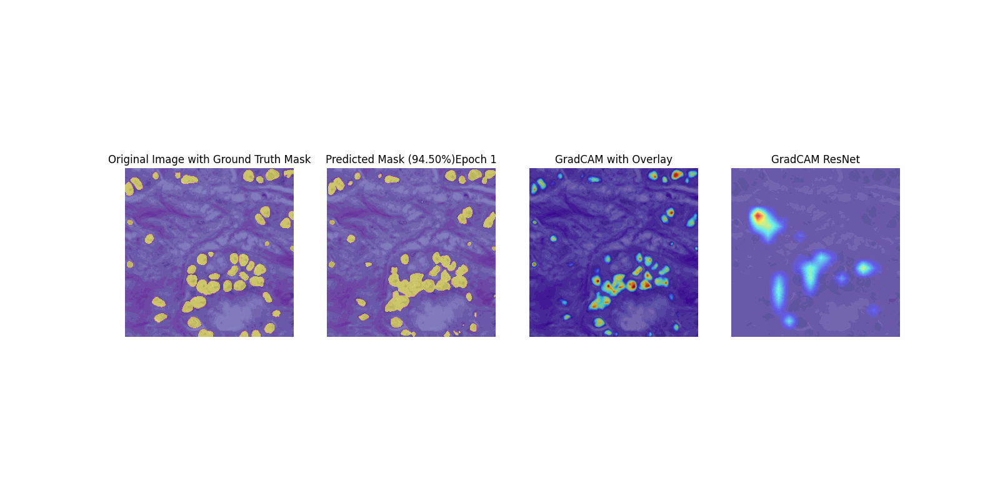

In [12]:
images = []
for epoch in range(1, num_epochs + 1):
    images.append(imageio.v2.imread(os.path.join(images_dir, f'epoch_{epoch}.png')))

gif_path = os.path.join(images_dir, 'training_progress.gif')
imageio.mimsave(gif_path, images, duration=1, loop=0)

display.Image(gif_path)

### Evaluation

- **Accuracy**: The number of correct predictions out of the total of predictions. Higher means better.

- **Loss**: How well the predictions matched the expected result. Lower means better.

- **Dice**: Calculates the similarity between the intersection of two images. Higher means better.

- **Intersection over Union (IoU)**: It calculates the overlap between the predicted image and the ground truth, but it also takes in consideration the union of the boxes, while Dice only accounts for the intersection.Higher means better.

- **Panoptic Quality (PQ)**: Indicates the performance in segmenting instances accurately. Higher means better.

- **Aggregated Jaccard Index (AJI)**: Indicate the performance of the alignment between predicted and ground truth instance boundaries. Higher means better.

- **Specificity**: Measures the proportion of actual negatives that are correctly identified. Higher means better.

- **Sensitivity**: Measures the proportion of actual positives that are correctly identified. Higher means better.

In [13]:

def calculate_metrics(predictions, targets):
    true_positives = ((predictions == 1) & (targets == 1)).sum().item()
    true_negatives = ((predictions == 0) & (targets == 0)).sum().item()
    false_positives = ((predictions == 1) & (targets == 0)).sum().item()
    false_negatives = ((predictions == 0) & (targets == 1)).sum().item()
    
    intersection = torch.logical_and(predictions, targets).sum().item()
    union = torch.logical_or(predictions, targets).sum().item()
    
    return true_positives, true_negatives, false_positives, false_negatives, intersection, union

model.eval()
accuracies = []
losses = []
dices = [] 
ious = []
specificities = []
sensitivities = []
pqs = []
ajis = []

ev_running_loss = 0.0
ev_correct_predictions = 0
ev_total_samples = 0
ev_true_positives = 0
ev_true_negatives = 0
ev_false_positives = 0
ev_false_negatives = 0
ev_aji = 0
batch_iou = 0

with torch.no_grad():
    for ev_images, ev_masks, _ in validation_dataloader:
        ev_images, ev_masks = ev_images.to(device), ev_masks.to(device)
        ev_outputs = model(ev_images)
        ev_loss = F.binary_cross_entropy(ev_outputs, ev_masks)
        ev_running_loss += ev_loss.item()
        losses.append(ev_loss.item())

        #Thresholding the prediction values
        ev_binary_predictions = (ev_outputs > 0.5).float()

        #Calculating the correct pixels
        ev_correct_predictions += (ev_binary_predictions == ev_masks).sum().item()
        ev_total_samples += ev_masks.numel()

        #Calculate metrics
        tp, tn, fp, fn, intersection, union = calculate_metrics(ev_binary_predictions, ev_masks)
        
        ev_true_positives += tp
        ev_true_negatives += tn
        ev_false_positives += fp
        ev_false_negatives += fn
        
        #Calculating IoU
        iou = intersection / union if union > 0 else 0.0
        batch_iou += iou
        ious.append(iou)

        #Calculating AJI
        aji_numerator = intersection
        aji_denominator = union + fp + fn
        aji = aji_numerator / aji_denominator if aji_denominator > 0 else 0.0
        ev_aji += aji
        ajis.append(aji)

        #Calculate accuracy
        batch_accuracy = (ev_binary_predictions == ev_masks).sum().item() / ev_masks.numel()
        accuracies.append(batch_accuracy)

        #Calculate Dice coefficient
        dice_coefficient = (2 * tp) / (2 * tp + fp + fn) if (2 * tp + fp + fn) > 0 else 0.0
        dices.append(dice_coefficient)

        #Precision and recall
        precision = tp / (tp + fp) if (tp + fp) > 0 else 0.0
        recall = tp / (tp + fn) if (tp + fn) > 0 else 0.0
        pqs.append(precision * recall if precision + recall > 0 else 0.0)
        
        #Specificity and sensitivity
        sensitivities.append(recall)
        specificities.append(tn / (tn + fp) if (tn + fp) > 0 else 0.0)

#Precision and recall
precision = ev_true_positives / (ev_true_positives + ev_false_positives) if (ev_true_positives + ev_false_positives) > 0 else 0.0
recall = ev_true_positives / (ev_true_positives + ev_false_negatives) if (ev_true_positives + ev_false_negatives) > 0 else 0.0

#Specificity and sensitivity
ev_sensitivity = recall
ev_specificity = ev_true_negatives / (ev_true_negatives + ev_false_positives) if (ev_true_negatives + ev_false_positives) > 0 else 0.0

#Evaluation loss and accuracy
ev_loss = ev_running_loss / len(validation_dataloader)
ev_accuracy = ev_correct_predictions / ev_total_samples

#Dice coefficient
ev_temp_dice = (2 * ev_true_positives) / (2 * ev_true_positives + ev_false_positives + ev_false_negatives) if (2 * ev_true_positives + ev_false_positives + ev_false_negatives) > 0 else 0.0

#PQ
ev_pq = precision * recall if precision + recall > 0 else 0.0

#IoU
iou = batch_iou / len(validation_dataloader)

#AJI
aji = ev_aji / len(validation_dataloader)

#Calculate standard deviation
loss_std = np.std(losses)
accuracy_std = np.std(accuracies)
dice_std = np.std(dices)
iou_std = np.std(ious)
specificity_std = np.std(specificities)
sensitivity_std = np.std(sensitivities)
pq_std = np.std(pqs)
aji_std = np.std(ajis)

print(f'Evaluation Loss: {ev_loss * 100:0.2f}% (Std: {loss_std * 100:0.2f}%)')
print(f'Evaluation Accuracy: {ev_accuracy * 100:0.2f}% (Std: {accuracy_std * 100:0.2f}%)')
print(f'Dice Coefficient: {ev_temp_dice * 100:0.2f}% (Std: {dice_std * 100:0.2f}%)')
print(f'IoU: {iou * 100:0.2f}% (Std: {iou_std * 100:0.2f}%)')
print(f'Specificity: {ev_specificity * 100:0.2f}% (Std: {specificity_std * 100:0.2f}%)')
print(f'Sensitivity: {ev_sensitivity * 100:0.2f}% (Std: {sensitivity_std * 100:0.2f}%)')
print(f'PQ: {ev_pq * 100:0.2f}% (Std: {pq_std * 100:0.2f}%)')
print(f'AJI: {aji * 100:0.2f}% (Std: {aji_std * 100:0.2f}%)')


Evaluation Loss: 3.94% (Std: 0.50%)
Evaluation Accuracy: 98.33% (Std: 0.21%)
Dice Coefficient: 95.58% (Std: 0.53%)
IoU: 91.49% (Std: 0.97%)
Specificity: 98.51% (Std: 0.22%)
Sensitivity: 97.53% (Std: 0.57%)
PQ: 91.40% (Std: 1.00%)
AJI: 84.32% (Std: 1.63%)


### ResNet predicting with model output

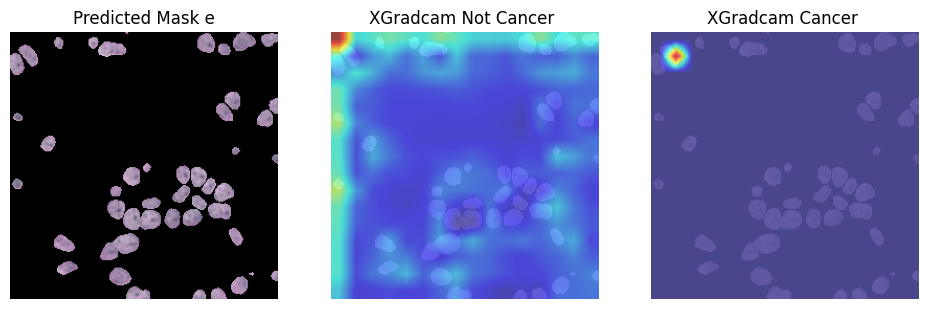

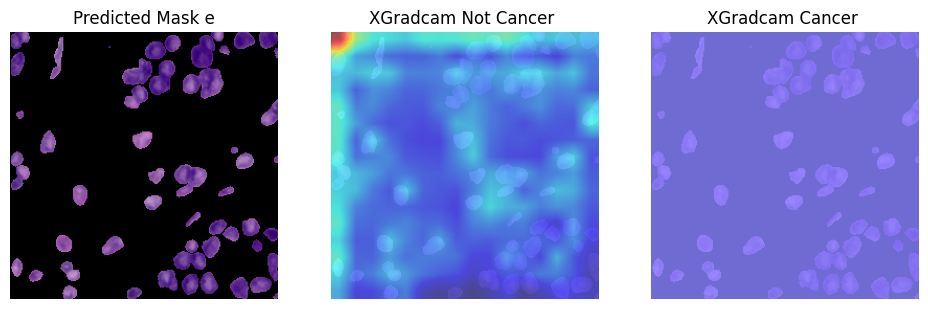

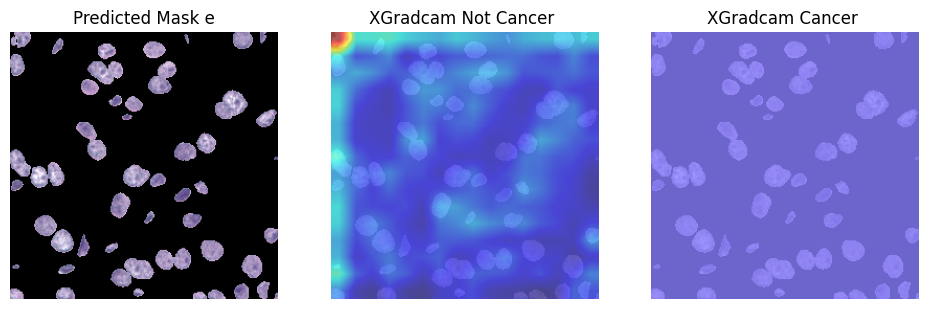

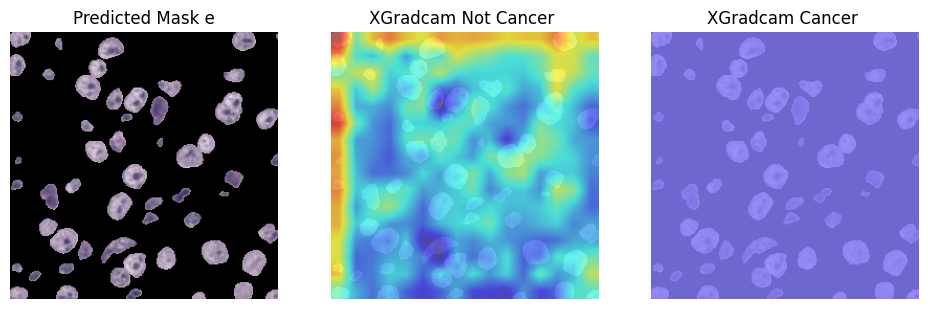

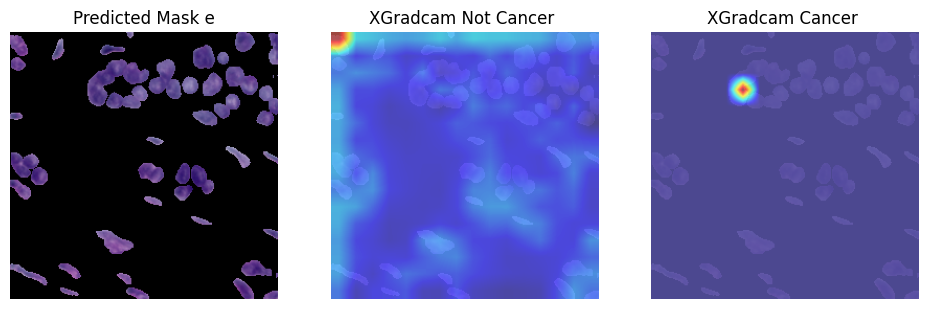

In [14]:
model.eval()
model_resnet.eval()
counter = 0
correct_predictions = 0
total_predictions = 0

for ev_images, ev_masks, ev_names in test_dataloader:
    with torch.no_grad():
        model_resnet.eval()
        ev_images, ev_masks = ev_images.to(device), ev_masks.to(device)
        ev_outputs = model(ev_images)
        ev_binary_predictions = (ev_outputs > 0.5).float()
        
        new_image = ev_images[0].clone()
        binary_mask = ev_binary_predictions[0].expand_as(new_image)
        new_image[binary_mask == 0] = 0 # new_image[binary_mask == 0]/2
        new_image_np = new_image.to("cpu").numpy().transpose(1, 2, 0)
        
        counter += 1

        real_class = ev_names[0]
        file_name_without_ext = os.path.splitext(real_class)[0]
        middle_element = file_name_without_ext[1]

        plt.figure(figsize=(20, 20))
        plt.subplot(1, 5, 1)
        plt.imshow(new_image_np)
        plt.title(f'Predicted Mask {middle_element}')
        plt.axis('off')

        resnet_output = model_resnet(new_image.unsqueeze(0).to(device))
        resnet_probs = torch.nn.functional.softmax(resnet_output, dim=1)
        predictions = resnet_probs.squeeze().cpu().detach().numpy()

        threshold = 0.30
        class_names = ["Not Cancer", "Cancer"]
        active_classes = [f"{class_name}: {prediction * 100:.2f}%" for class_name, prediction in zip(class_names, predictions) if prediction > threshold]

        new_image_4d = new_image.unsqueeze(0)
    total_predictions += 1

    for idx, class_name in enumerate(class_names):
        plt.subplot(1, 5, idx + 2)
        plt.imshow(generate_ResNet_CAM(model_resnet, new_image_4d, 0, [model_resnet.layer3[-1]], "xgradcam", target_label=idx))
        plt.title(f'XGradcam {class_name} ')
        plt.axis('off')

    plt.show()
    
    if counter == 5:
        break


### Plotting Charts



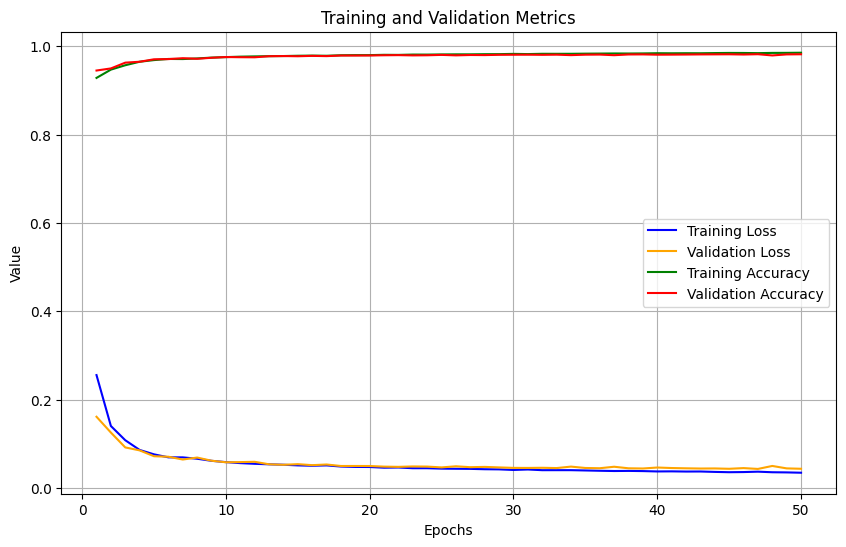

In [15]:
epochs_list = range(1, num_epochs + 1)

plt.figure(figsize=(10, 6))

def to_cpu_and_numpy(data):
    if isinstance(data, torch.Tensor):
        return data.cpu().numpy()
    return data

training_losses = [to_cpu_and_numpy(loss) for loss in training_losses]
val_losses = [to_cpu_and_numpy(loss) for loss in val_losses]
training_accuracies = [to_cpu_and_numpy(acc) for acc in training_accuracies]
val_accuracies = [to_cpu_and_numpy(acc) for acc in val_accuracies]

plt.plot(epochs_list, training_losses, label='Training Loss', color='blue')
plt.plot(epochs_list, val_losses, label='Validation Loss', color='orange')
plt.plot(epochs_list, training_accuracies, label='Training Accuracy', color='green')
plt.plot(epochs_list, val_accuracies, label='Validation Accuracy', color='red')

plt.xlabel('Epochs')
plt.ylabel('Value')
plt.title('Training and Validation Metrics')
plt.legend()
plt.grid(True)
plt.show()


### Predictions

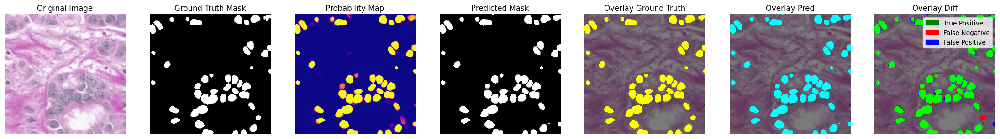

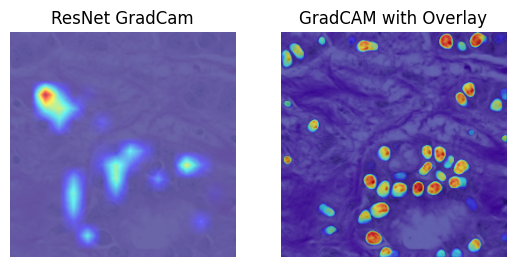

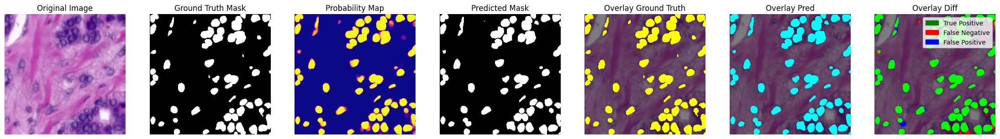

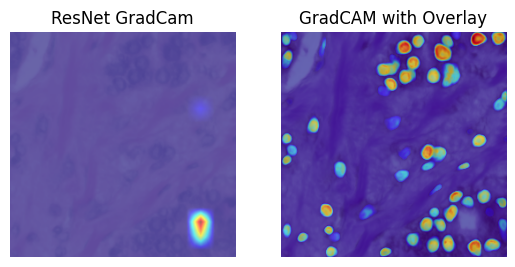

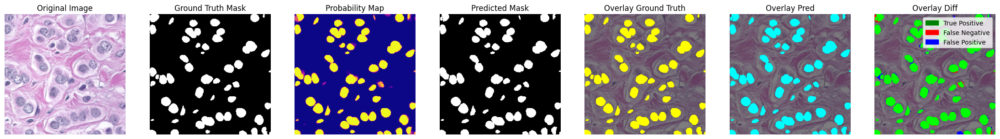

...

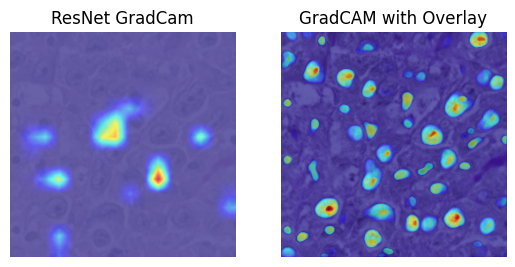

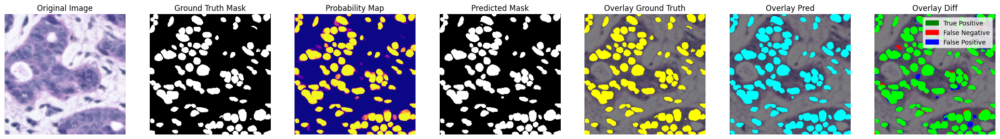

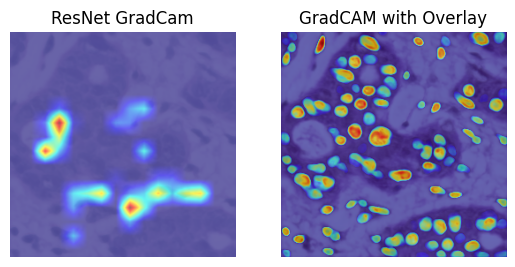

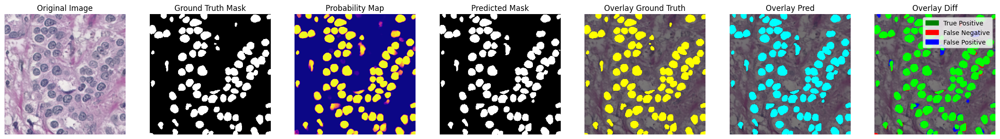

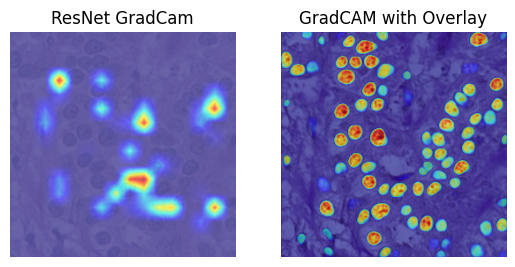

In [16]:
if show_images:
    counter = 0
    brightness = 0.5
    for images, masks, _ in test_dataloader:
        with torch.no_grad():
            images, masks = images.to(device), masks.to(device)
            images_normalized = images

            outputs = model(images_normalized)
            probs = outputs
            #probs = F.softmax(outputs, dim=1)

            images_np = images_normalized.cpu().numpy()
            masks_np = masks.cpu().numpy()
            probs_np = probs.cpu().numpy()

            threshold = 0.5
            preds_np = (probs_np > threshold).astype(np.uint8)
            preds_np_squeezed = np.squeeze(preds_np, axis=1) 

            original_image = images_np[0].transpose((1, 2, 0))
            ground_truth_mask = masks_np[0, 0]
            predicted_mask = preds_np_squeezed[0]
            probability_map = probs_np[0, 0]

            overlay_gt = original_image.copy()
            overlay_gt = original_image * brightness # to make it a little darker
            overlay_gt[ground_truth_mask == 1] = [1, 1, 0]

            overlay_pred = original_image.copy()
            overlay_pred = original_image * brightness
            overlay_pred[predicted_mask == 1] = [0, 1, 1]

            overlay_diff = original_image.copy()
            overlay_diff = original_image * brightness 
            overlay_diff[(ground_truth_mask == 1) & (predicted_mask == 1)] = [0, 1, 0]  #correct predictions
            overlay_diff[(ground_truth_mask == 1) & (predicted_mask == 0)] = [1, 0, 0]  #missed predictions
            overlay_diff[(ground_truth_mask == 0) & (predicted_mask == 1)] = [0, 0, 1]  #false positives

            plt.figure(figsize=(28, 4))

            plt.subplot(1, 7, 1)
            plt.imshow(original_image)
            plt.axis("off")
            plt.title("Original Image")

            plt.subplot(1, 7, 2)
            plt.imshow(ground_truth_mask, cmap='gray')
            plt.axis("off")
            plt.title("Ground Truth Mask")

            plt.subplot(1, 7, 3)
            plt.imshow(probability_map, cmap='plasma')
            plt.axis("off")
            plt.title("Probability Map")

            plt.subplot(1, 7, 4)
            plt.imshow(predicted_mask, cmap='gray')
            plt.axis("off")
            plt.title("Predicted Mask")

            plt.subplot(1, 7, 5)
            plt.imshow(overlay_gt)
            plt.axis("off")
            plt.title("Overlay Ground Truth")

            plt.subplot(1, 7, 6)
            plt.imshow(overlay_pred)
            plt.axis("off")
            plt.title("Overlay Pred")

            green_patch = mpatches.Patch(color='green', label='True Positive')
            red_patch = mpatches.Patch(color='red', label='False Negative')
            blue_patch = mpatches.Patch(color='blue', label='False Positive')
            plt.subplot(1, 7, 7)
            plt.imshow(overlay_diff)
            plt.title("Overlay Diff")
            plt.axis("off")
            plt.legend(handles=[green_patch, red_patch, blue_patch], loc='upper right')

            plt.show()

        #showing gradcams
        resnet_img = generate_ResNet_CAM(model_resnet, images, 0, [model_resnet.layer3[-1]], "xgradcam", 1)
        plt.subplot(1,2,1)
        plt.imshow(resnet_img)
        plt.title("ResNet GradCam")
        plt.axis("off")

        plt.subplot(1,2,2)
        #gradcam heatmap
        heatmap = generate_heatmap_with_tensor(images[0].half())
        img = images[0].cpu().detach().permute(1, 2, 0).numpy()
        img = (img - img.min()) / (img.max() - img.min()) #normalizing
        img = np.uint8(255 * img)
        heatmap = np.uint8(255 * heatmap)
        heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
        heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
        superimposed_img = cv2.addWeighted(heatmap, 0.6, img, 1 - 0.6, 0)
        plt.imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
        plt.title('GradCAM with Overlay')
        plt.axis('off')
        
        plt.show()

        counter += 1
        if counter == 10:
            break